In [1]:
import os
import rasterio
from rasterio.merge import merge
from rasterio.plot import show
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import requests
import folium
import geopandas as gpd
import pandas as pd
from shapely.geometry import Polygon
from sqlalchemy import create_engine, inspect
from geoalchemy2 import Geometry, WKTElement

In [27]:
# connect to database
db_name = "urbanmining"
username = "postgres"
password = "Tunacompany5694!"
host = "localhost"  # or your host if it's not local
port = "5432"  # default port for PostgreSQL
connection_string = f"postgresql://{username}:{password}@{host}:{port}/{db_name}"
engine = create_engine(connection_string)

# Request and check resolution of AHN GeoTiff 
Historical AHN GeoTiffs can be requested using WCS. Links for all the versions (AHN 1-4) are listed [here](https://geoforum.nl/t/ogc-services-wms-wmts-wcs-voor-ahn1-2-3/8531). AHN 2-4 are relevant to this research. Together, they cover elevation from 2007 - now. I also considered using the 3D Basisvoorziening dataset (3D building volumes), but unfortunately they only started producing this data starting 2020, which doesn't fully cover our study period.

Looking at a sample of AHN 2, here's what I've found out so far: 
- Units and resolution
    - I think the elevation data is measured in cm, not m. This is because the highest elevation value for NL is ~25000. If it was 25000cm, then it would be 250m, which makes more sense than 25000m... 
    - The lowest values are also quite strange, but I will assume those are just null values.
    - While AHN2 has a resolution of 0.5m, I think a 5m resolution is enough to estimate building heights. 
- Requesting data
    - When requesting the data, you can specify two things: the bbox (epsg=28992), and the width/height (in n pixels). Specifying these two values allows you to also determine the resolution of the GeoTiff. For example, if you request a large bbox and small width/height (n pixels), you end up with a low resolution, and vice versa. 
    - There is a limit to how many pixels you can request at once: 2048x2048. To download data for the whole NL, we will need to separate the area into a grid of tiles, request the tiles one by one, then stitch them together.  

In [35]:
# visualize geotiff
def plot_geotiff(geotiff_path, title): 
    with rasterio.open(geotiff_path) as src:
        data = src.read(1)
        plt.figure(figsize=(10,10))
        plt.imshow(data, cmap='viridis')
        plt.colorbar()
        plt.title(title)
        plt.show()

def get_geotiff_minmax(geotiff_path, print_output=True): 
    with rasterio.open(geotiff_path) as src:
        data = src.read(1)
        min_val = data.min()
        max_val = data.max()
        if print_output: 
            print(f'min: {min_val}, max: {max_val}')
    return min_val, max_val

In [5]:
pixel_size_main = 2 # pixel size in meters

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 2048, 'height': 2048, 'count': 2, 'crs': CRS.from_epsg(28992), 'transform': Affine(2.0, 0.0, 142456.29785,
       0.0, -2.0, 476347.34265), 'blockysize': 1, 'tiled': False, 'compress': 'deflate', 'interleave': 'pixel'}
duration of request: 2.118349075317383


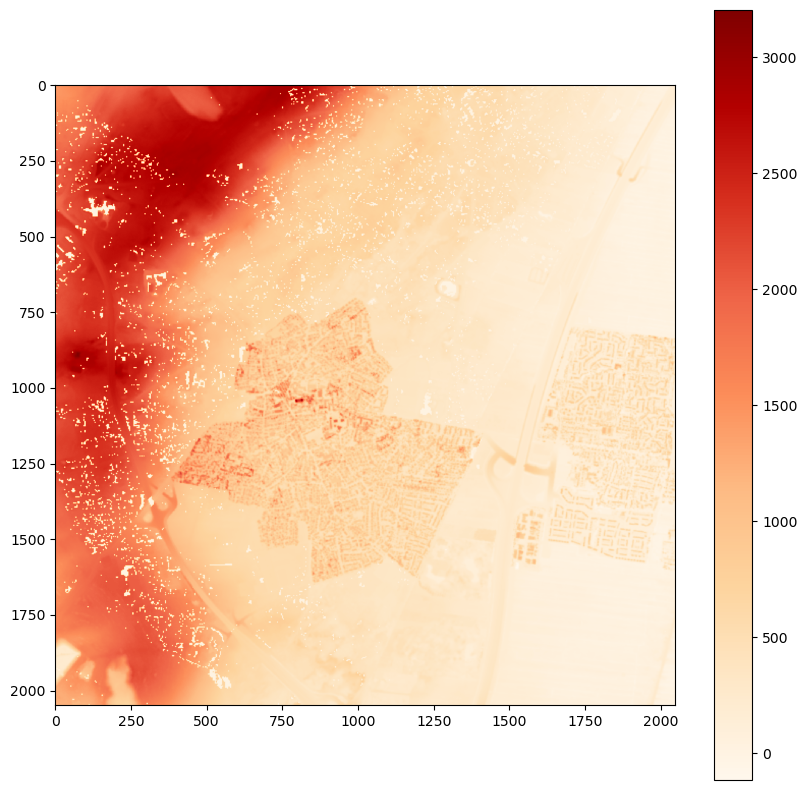

In [5]:
# get tiff file according to bbox and pixel size 
xmin, ymin, xmax, ymax = -21994.3727,285846.6504,289002.9684,638752.0349 # bbox coordinates for NL  
bbox_nl = f'{xmin}, {ymin}, {xmax}, {ymax}' 
pixel_size = pixel_size_main # pixel size in meters
zoom = 1
max_width, max_height = 2048/zoom, 2048/zoom
centroid = (xmin + xmax) / 2 + 11000, (ymin + ymax) / 2 + 12000
bbox_tile = f'{centroid[0] - 0.5*max_width*pixel_size},{centroid[1] - 0.5*max_height*pixel_size},{centroid[0] + 0.5*max_width*pixel_size},{centroid[1] + 0.5*max_height*pixel_size}'

# measure how long it takes to request the data
import time
start = time.time()
# make url
url = f'https://api.ellipsis-drive.com/v3/ogc/wcs/552c92e8-8422-46eb-bb55-1eb39e18eee9?service=WCS&request=GetCoverage&version=1.0.0&coverage=a19ef596-c48b-479e-87f5-b808cf6fb4d3&bbox={bbox_tile}&crs=EPSG:28992&format=GeoTIFF&width={max_width}&height={max_height}'
response = requests.get(url)
with open('data/ahn/test.tif', 'wb') as f:
    f.write(response.content)

# read tiff file
with rasterio.open('data/ahn/test.tif') as src:
    data = src.read(1)
    data = np.where(data < -9999, np.nan, data)
    data_masked = ma.masked_invalid(data)
    print(src.profile)
end = time.time()
duration_request = end - start
print(f'duration of request: {duration_request}')

# Plot the clipped data
plt.figure(figsize=(10,10))
plt.imshow(data_masked, cmap='OrRd')
plt.colorbar()
plt.show()

# Create grid for requesting GeoTiff
Here, we: 
- create the grid of tiles for requesting the GeoTiffs from AHN
- select tiles that contain buildings that were constructed / renovated / demolished between 2011 - now. This saves us from requesting data we don't need. 

In [6]:
# bbox info
xmin, ymin, xmax, ymax = -21994.3727,285846.6504,289002.9684,638752.0349 # bbox coordinates for NL  
bbox_nl = f'{xmin}, {ymin}, {xmax}, {ymax}' 
pixel_size = pixel_size_main # pixel size in meters
max_width_pixels, max_height_pixels = 2048, 2048

# make grid of tiles in bbox_nl
tile_width, tile_height = max_width_pixels * pixel_size, max_height_pixels * pixel_size
x_range = np.arange(xmin, xmax, tile_width)
y_range = np.arange(ymin, ymax, tile_height)
tiles = []
tiles_bbox = []
for x in x_range:
    for y in y_range:
        tile = Polygon([(x, y), (x + tile_width, y), (x + tile_width, y + tile_height), (x, y + tile_height)])
        tiles.append(tile)
        tiles_bbox.append(f'{x},{y},{x+tile_width},{y+tile_height}') 
grid_gdf = gpd.GeoDataFrame(geometry=tiles, crs='EPSG:28992')
grid_gdf['bbox'] = tiles_bbox

# get NL geometry to check if grid is correct
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
nl = world[world['name'] == 'Netherlands']
nl.to_crs('epsg:28992', inplace=True)

# keep only tiles that intersect with NL (buffer 5km just in case)
nl_buffer = nl.geometry.buffer(5000)
grid_gdf = grid_gdf[grid_gdf.intersects(nl_buffer.unary_union)]

# save grid_gdf to database
grid_gdf['geometry_string'] = grid_gdf['geometry'].apply(lambda x: x.wkt)
grid_gdf.to_postgis('grid_forgeotiffdownload', engine, if_exists='replace')

# select grid tiles that contain housing emissions 
query = ''' 
SELECT DISTINCT g.*
FROM grid_forgeotiffdownload g 
JOIN housing_emissions_nl h
ON ST_Intersects(g.geometry, h.geom_28992)
'''
grid_cropped = pd.read_sql(query, engine)
from shapely import wkt
grid_cropped['geometry'] = grid_cropped['geometry_string'].apply(wkt.loads)
grid_cropped = gpd.GeoDataFrame(grid_cropped, geometry='geometry', crs='EPSG:28992')
grid_cropped = grid_cropped.reset_index().rename(columns={'index': 'grid_id'})
grid_cropped.to_file('data_cleaned/ahn/grid_cropped.shp')

/var/folders/r0/dcf480211ql6v50vx1qh0m080000gn/T/ipykernel_29079/761019798.py:22: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
/opt/homebrew/Caskroom/miniconda/base/envs/geo_env/lib/python3.9/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/var/folders/r0/dcf480211ql6v50vx1qh0m080000gn/T/ipykernel_29079/761019798.py:46: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  grid_croppe

In [28]:
grid = gpd.read_file('data_cleaned/ahn/grid_cropped.shp')
grid[(grid.grid_id >= 1670) & (grid.grid_id <= 1690)]

,grid_id,bbox,geometry_s,geometry
1670,1670,"129557.6273,466070.6504,133653.6273,470166.6504","POLYGON ((129557.6273 466070.6504, 133653.6273...","POLYGON ((129557.627 466070.650, 129557.627 47..."
1671,1671,"129557.6273,470166.6504,133653.6273,474262.6504","POLYGON ((129557.6273 470166.6504, 133653.6273...","POLYGON ((129557.627 470166.650, 129557.627 47..."
1672,1672,"129557.6273,474262.6504,133653.6273,478358.6504","POLYGON ((129557.6273 474262.6504, 133653.6273...","POLYGON ((129557.627 474262.650, 129557.627 47..."
1673,1673,"129557.6273,478358.6504,133653.6273,482454.6504","POLYGON ((129557.6273 478358.6504, 133653.6273...","POLYGON ((129557.627 478358.650, 129557.627 48..."
1674,1674,"133653.6273,474262.6504,137749.6273,478358.6504","POLYGON ((133653.6273 474262.6504, 137749.6273...","POLYGON ((133653.627 474262.650, 133653.627 47..."
1675,1675,"133653.6273,478358.6504,137749.6273,482454.6504","POLYGON ((133653.6273 478358.6504, 137749.6273...","POLYGON ((133653.627 478358.650, 133653.627 48..."
1676,1676,"133653.6273,482454.6504,137749.6273,486550.6504","POLYGON ((133653.6273 482454.6504, 137749.6273...","POLYGON ((133653.627 482454.650, 133653.627 48..."
1677,1677,"133653.6273,486550.6504,137749.6273,490646.6504","POLYGON ((133653.6273 486550.6504, 137749.6273...","POLYGON ((133653.627 486550.650, 133653.627 49..."
1678,1678,"129557.6273,482454.6504,133653.6273,486550.6504","POLYGON ((129557.6273 482454.6504, 133653.6273...","POLYGON ((129557.627 482454.650, 129557.627 48..."
1679,1679,"129557.6273,486550.6504,133653.6273,490646.6504","POLYGON ((129557.6273 486550.6504, 133653.6273...","POLYGON ((129557.627 486550.650, 129557.627 49..."


In [26]:
# print stats
grid = gpd.read_file('data_cleaned/ahn/grid_cropped.shp')
grid_toPlot = grid.copy()
grid_toPlot = grid_toPlot.iloc[1673:1685]
grid_toPlot.to_crs('epsg:4326', inplace=True)
# file_size = os.path.getsize('data/ahn/test.tif') / 1e6
# print(f'{len(grid_toPlot)} tiles (x3): ~{len(grid_toPlot)*3*duration_request/60:.2f} minutes, ~{round(file_size * 3 * len(grid_toPlot) * 0.001, 2)} GB')

# plot grid on folium
m = folium.Map(location=[52.1326, 5.2913], zoom_start=8)
for _, row in grid_toPlot.iterrows():
    geojson = folium.GeoJson(row['geometry'])
    popup = folium.Popup(f"Grid ID: {row['grid_id']}", parse_html=True)
    geojson.add_child(popup)
    geojson.add_to(m)
m

# Request AHN data using grid of tiles
Get DSM, DTM data from AHN2-4, make `buildingHeight.tif` from downloaded files

### URL dictionary

In [8]:
url_dict = {
    'dsm': { # dsm = digital surface model = elevation of earth's surface including all objects in it (e.g. buildings, trees, etc.)
        'ahn2': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/28fb0f5f-e367-4265-b84b-1b8f1a8a6409?service=WCS&request=GetCoverage&version=1.0.0'
            f'&coverage=ae53fd8e-6310-42b5-9a43-12c588ff61c1&crs=EPSG:28992&format=GeoTIFF&width=2048&height=2048' # &bbox={bbox}'
        ), 
        'ahn3': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/94037eea-4196-48db-9f83-0ef330a7655e?SERVICE=WCS&VERSION=1.0.0&REQUEST=GetCoverage'
            f'&COVERAGE=7daaa215-4cd0-48cd-9484-2eb5cec674e1&FORMAT=geotiff&CRS=EPSG:28992&width=2048&height=2048' # &WIDTH={max_width}&HEIGHT={max_height}&BBOX={bbox}'
        ), 
        'ahn4': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/78080fff-8bcb-4258-bb43-be9de956b3e0?SERVICE=WCS&VERSION=1.0.0&REQUEST=GetCoverage'
            f'&COVERAGE=fa6672ac-7a4f-47cd-bcea-806584f0bfe3&FORMAT=GeoTIFF&CRS=EPSG:28992&width=2048&height=2048' # &BBOX={bbox}&WIDTH={max_width}&HEIGHT={max_height}'
        ), 
    }, 
    'dtm': { # dtm = digital terrain model = elevation of the bare earth surface
        'ahn2': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/e96b10b9-e964-414c-958c-57a9dbe24e62?service=WCS&request=GetCoverage&version=1.0.0'
            f'&coverage=f380e0a0-4446-4d79-b2d1-3d4df40cbc93&crs=EPSG:28992&format=GeoTIFF&width=2048&height=2048'
        ), 
        'ahn3': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/69f81443-c000-4479-b08f-2078e3570394?service=WCS&request=GetCoverage&version=1.0.0'
            f'&coverage=393408cf-842d-4181-af87-94f6123bdff0&crs=EPSG:28992&format=GeoTIFF&width=2048&height=2048'
        ), 
        'ahn4': (
            f'https://api.ellipsis-drive.com/v3/ogc/wcs/8b60a159-42ed-480c-ba86-7f181dcf4b8a?service=WCS&request=GetCoverage&version=1.0.0'
            f'&coverage=54e1e21c-50fe-42a4-b9fb-1f25ccb199af&crs=EPSG:28992&format=GeoTIFF&width=2048&height=2048'
        ), 
    }
}

### Functions

In [28]:
def request_tiff_fromBbox(bbox, grid_id, model_name, ahn_version, print=False, return_response=False):
    url = url_dict[model_name][ahn_version] + f'&bbox={bbox}'
    response = requests.get(url)
    file_path = f'data/ahn/{ahn_version}_{model_name}_{grid_id}.tif'
    with open(file_path, 'wb') as f:
        f.write(response.content)
    if print: 
        print(f'saved {file_path}')
    if return_response: 
        return response

def convert_tiff(id, model_name, ahn_version):
    file_path = f'data/ahn/{ahn_version}_{model_name}_{id}.tif'
    with rasterio.open(file_path, 'r+') as dataset:
        data = dataset.read(1)
        data = data + 0.1
        dataset.write(data, 1)

def request_tiff_fromGridApply(row):
    for model_name in ['dsm', 'dtm']:
        for ahn_version in ['ahn2', 'ahn3', 'ahn4']:
            request_tiff_fromBbox(row.bbox, row.grid_id, model_name, ahn_version)
            if model_name == 'dsm' and ahn_version == 'ahn2':
                convert_tiff(row.grid_id, model_name, ahn_version)

def merge_tif_files(ahn_version, model_name, compression = 'none', return_mosaic=False): 

    # find all tiff files starting with '{ahn_version}_{model_name}'
    tiff_files = [f'data/ahn/{f}' for f in os.listdir('data/ahn') if f.startswith(f'{ahn_version}_{model_name}')]
    if f'data/ahn/{ahn_version}_{model_name}_merged.tif' in tiff_files:
        tiff_files.remove(f'data/ahn/{ahn_version}_{model_name}_merged.tif')
    
    # get a sample of .tifs to merge
    # for i in range(10, 2270): 
    #     if f'data/ahn/{ahn_version}_{model_name}_{i}.tif' in tiff_files: 
    #         tiff_files.remove(f'data/ahn/{ahn_version}_{model_name}_{i}.tif')
    
    # Merge the tiff files
    src_files_to_mosaic = []
    for fp in tiff_files:
        src = rasterio.open(fp)
        src_files_to_mosaic.append(src)
    mosaic, out_trans = merge(src_files_to_mosaic)

    # Update metadata
    out_meta = src.meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": out_trans, 
        "compress": compression,  # Use specified compression
        "dtype": mosaic.dtype  # Match the data type

    })

    # Write the merged result to a new TIFF file
    output_tiff = f'data/ahn/{ahn_version}_{model_name}_merged.tif'
    with rasterio.open(output_tiff, "w", **out_meta) as dest:
        dest.write(mosaic)

    if return_mosaic:
        return mosaic
    
def make_buildingHeight_tiff(ahn_version):
    with rasterio.open(f'data/ahn/{ahn_version}_dsm_merged.tif') as dsm_src, rasterio.open(f'data/ahn/{ahn_version}_dtm_merged.tif') as dtm_src:
        dsm = dsm_src.read(1)
        dtm = dtm_src.read(1)
        difference = dsm - dtm
        
        # Update the metadata for the output file
        out_meta = dsm_src.meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": difference.shape[0],
            "width": difference.shape[1],
            "transform": dsm_src.transform
        })
        
        # Write the difference to a new TIFF file
        with rasterio.open(f'data/ahn/{ahn_version}_objectHeight.tif', "w", **out_meta) as dest:
            dest.write(difference, 1)

In [15]:
nFiles_sample = 10
file_size = 25 # MB 
duration_request = 30 # seconds

file_size_final = file_size / nFiles_sample * 2261 * 6 # 6 groups of tifs in total: 3 ahn versions x 2 model types. 
print(f'final file size: {file_size_final/1000:.2f} GB')

duration_request_final = duration_request / nFiles_sample * 2261 * 6
print(f'final duration: {duration_request_final/60/60:.2f} hours')

final file size: 33.91 GB
final duration: 11.30 hours


In [31]:
compression_methods = ["none", "deflate", "packbits", "lzw"]
for method in compression_methods:
    merge_tif_files('ahn2', 'dsm', compression=method)
    file_size = os.path.getsize(f'data/ahn/ahn2_dsm_merged.tif')
    print(f"Compression: {method}, File Size: {file_size/1000000} megabytes")

Compression: none, File Size: 939.639158 megabytes
Compression: deflate, File Size: 42.692725 megabytes
Compression: packbits, File Size: 337.701167 megabytes
Compression: lzw, File Size: 129.358838 megabytes


In [45]:
8 / 10 * 2700 / 60

36.0

In [44]:
50 / 1000 / 10 * 2261 * 6

67.83

In [19]:
grid = gpd.read_file('data_cleaned/ahn/grid_cropped.shp')
# grid = grid[grid.grid_id.isin([516, 517, 518])]

# request tif tiles
grid.apply(lambda row: request_tiff_fromGridApply(row), axis=1)
# merge tif tiles and make building height tif
for ahn_version in ['ahn2', 'ahn3', 'ahn4']: 
    for model_name in ['dsm', 'dtm']: 
        merge_tif_files(ahn_version, model_name)
    make_buildingHeight_tiff(ahn_version)

KeyboardInterrupt: 

In [51]:
import os
import re

def calculate_tif_storage(directory):
    total_size = 0
    
    # Iterate over all files in the directory
    for filename in os.listdir(directory):
        # Check if the file is a .tif file and matches the pattern 'ahn2_dsm_#.tif'
        match = re.match(r'ahn2_dsm_(\d+)\.tif', filename)
        if match:
            file_number = int(match.group(1))
            if 1 <= file_number <= 50:
                file_path = os.path.join(directory, filename)
                # Add the size of the file to the total size
                total_size += os.path.getsize(file_path)
    
    # Convert the total size from bytes to gigabytes
    total_size_gb = total_size / (1024 ** 3)
    
    return total_size_gb

# Specify the directory containing the .tif files
directory = 'data/ahn'

# Calculate the total storage taken up by .tif files from ahn2_dsm_1.tif to ahn2_dsm_50.tif
total_storage_gb = calculate_tif_storage(directory)
print(f"Total storage taken up by .tif files from ahn2_dsm_1.tif to ahn2_dsm_50.tif: {total_storage_gb:.2f} GB")


Total storage taken up by .tif files from ahn2_dsm_1.tif to ahn2_dsm_50.tif: 0.27 GB


: 

# Check geotiff resolution in folium

In [33]:
def plot_geotiff_folium(raster_path): 
    import folium
    import rasterio
    from rasterio.warp import calculate_default_transform, reproject, Resampling
    import numpy as np
    from matplotlib import cm
    from matplotlib.colors import Normalize
    import io
    from PIL import Image
    import base64

    # Define the path to the GeoTIFF file
    # raster_path = 'data/ahn/ahn2_objectHeight.tif'

    # Open the GeoTIFF file and reproject to EPSG:4326
    with rasterio.open(raster_path) as src:
        transform, width, height = calculate_default_transform(
            src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': 'EPSG:4326',
            'transform': transform,
            'width': width,
            'height': height
        })

        # Create an in-memory raster
        out_image = np.empty(shape=(src.count, height, width), dtype=src.meta['dtype'])

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=out_image[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs='EPSG:4326',
                resampling=Resampling.nearest)

    # Get the new bounds after reprojection
    bounds = rasterio.transform.array_bounds(height, width, transform)

    # Normalize the image data to the range 0-255
    min_value = np.min(out_image)
    max_value = np.max(out_image)
    norm = Normalize(vmin=min_value, vmax=max_value)
    normalized_data = norm(out_image[0])

    # Convert normalized data to an image
    colormap = cm.get_cmap('viridis')  # Use a colormap for elevation visualization
    rgba_image = colormap(normalized_data)
    rgb_image = (rgba_image[:, :, :3] * 255).astype(np.uint8)  # Drop the alpha channel and convert to uint8

    # Convert the image array to a PIL image
    image = Image.fromarray(rgb_image)

    # Save the image to a byte buffer
    buffer = io.BytesIO()
    image.save(buffer, format="PNG")
    buffer.seek(0)

    # Encode the image in base64
    image_base64 = base64.b64encode(buffer.getvalue()).decode('utf-8')
    image_data_url = f"data:image/png;base64,{image_base64}"

    # Create a Folium map centered around the raster bounds
    center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
    m = folium.Map(location=center, zoom_start=14, tiles='cartodbpositron')

    # Create an image overlay using the base64-encoded image
    image_overlay = folium.raster_layers.ImageOverlay(
        image=image_data_url,
        bounds=[[bounds[1], bounds[0]], [bounds[3], bounds[2]]],
        opacity=0.5,
        interactive=True,
        cross_origin=False,
        zindex=1,
    )

    # Add the image overlay to the map
    image_overlay.add_to(m)

    # Display the map
    m

    return m

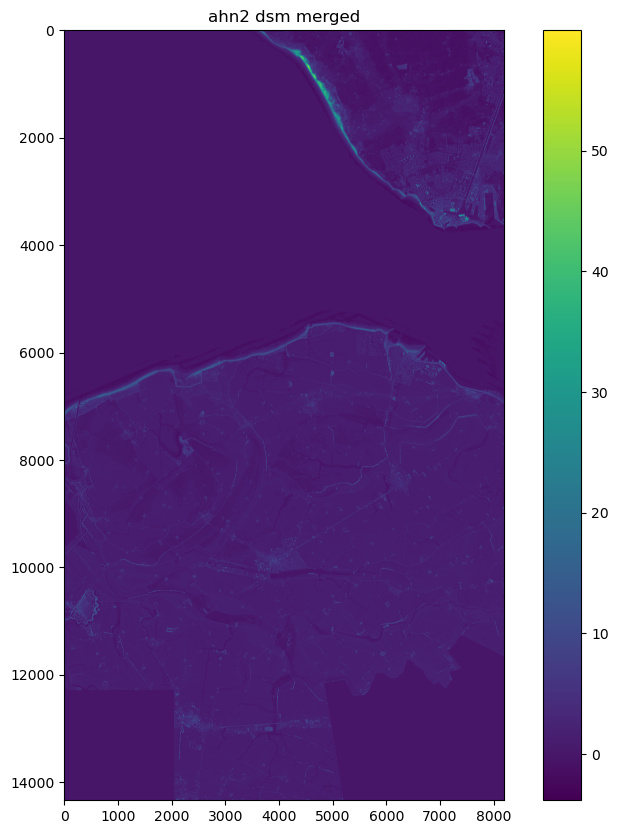

In [36]:
plot_geotiff('data/ahn/ahn2_dsm_merged.tif', 'ahn2 dsm merged')

In [41]:
0.111 / 10 * 2000

22.2

In [37]:
m = plot_geotiff_folium('data/ahn/ahn2_dsm_merged.tif')
m

/var/folders/r0/dcf480211ql6v50vx1qh0m080000gn/T/ipykernel_35432/858716193.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('viridis')  # Use a colormap for elevation visualization


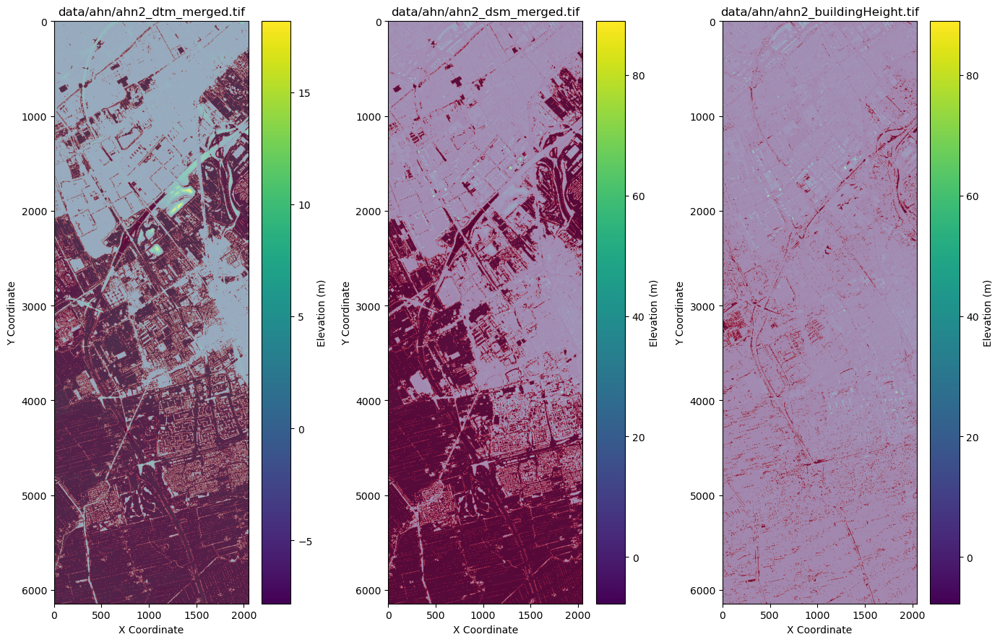

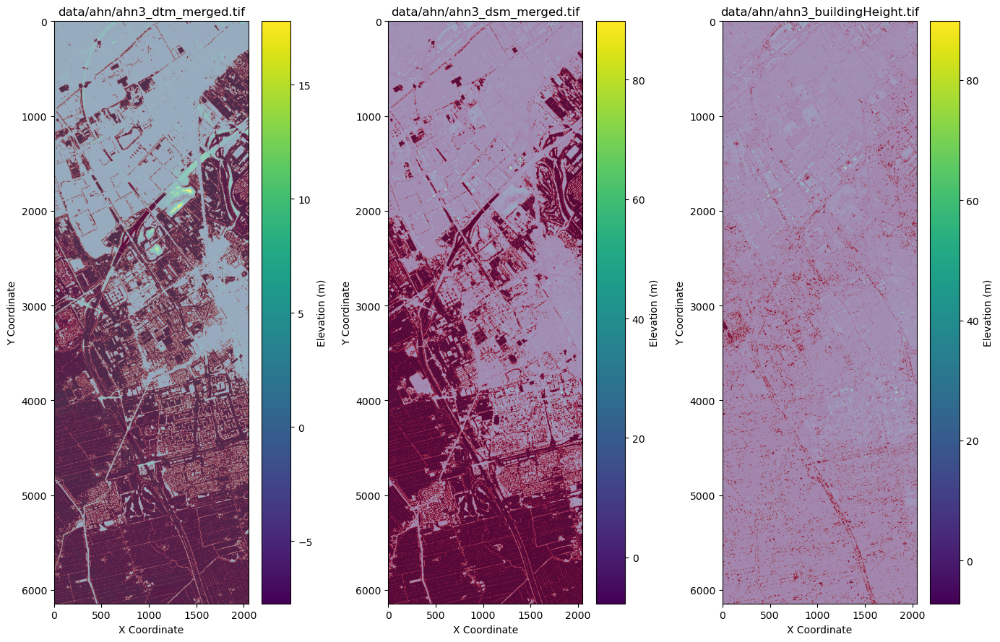

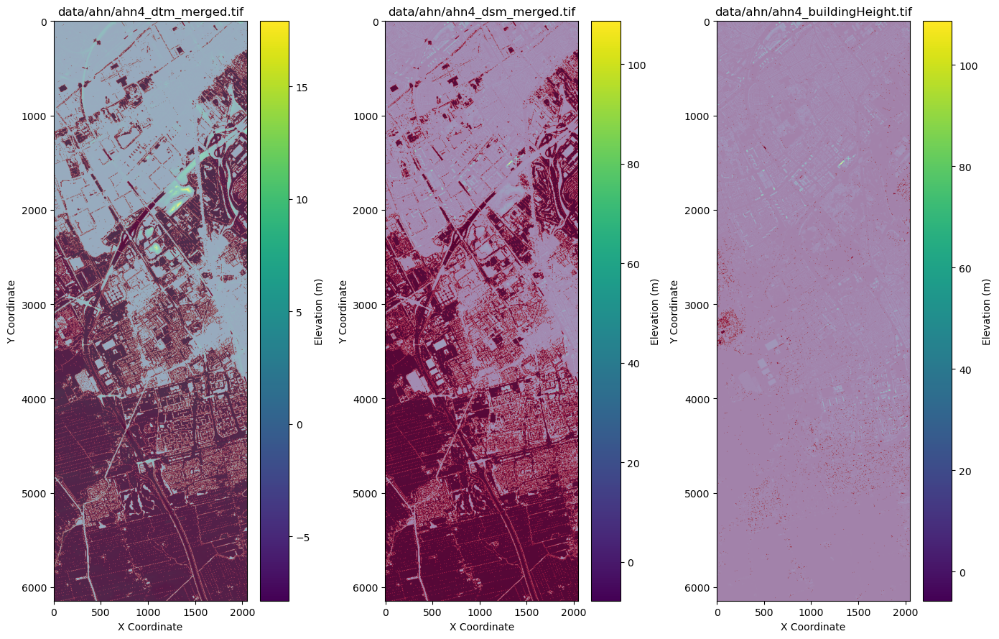

In [81]:
def plot_dtmDsmBh(ahn_version): 
    file_names = [f'data/ahn/{ahn_version}_dtm_merged.tif', f'data/ahn/{ahn_version}_dsm_merged.tif', f'data/ahn/{ahn_version}_buildingHeight.tif']

    # Create a figure with three subplots in a single row
    fig, axes = plt.subplots(1, 3, figsize=(14, 9))

    for ax, file_name in zip(axes, file_names):
        with rasterio.open(file_name) as src:
            raster = src.read(1)
            negative_mask = raster < 0 # cm

        # Plot the raster data
        img = ax.imshow(raster, cmap='viridis')
        ax.imshow(negative_mask, cmap='Reds', alpha=0.5)
        # Add a colorbar
        cbar = plt.colorbar(img, ax=ax, orientation='vertical')
        cbar.set_label('Elevation (m)')
        ax.set_title(file_name)
        ax.set_xlabel('X Coordinate')
        ax.set_ylabel('Y Coordinate')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

for ahn_version in ['ahn2', 'ahn3', 'ahn4']:
    plot_dtmDsmBh(ahn_version)   


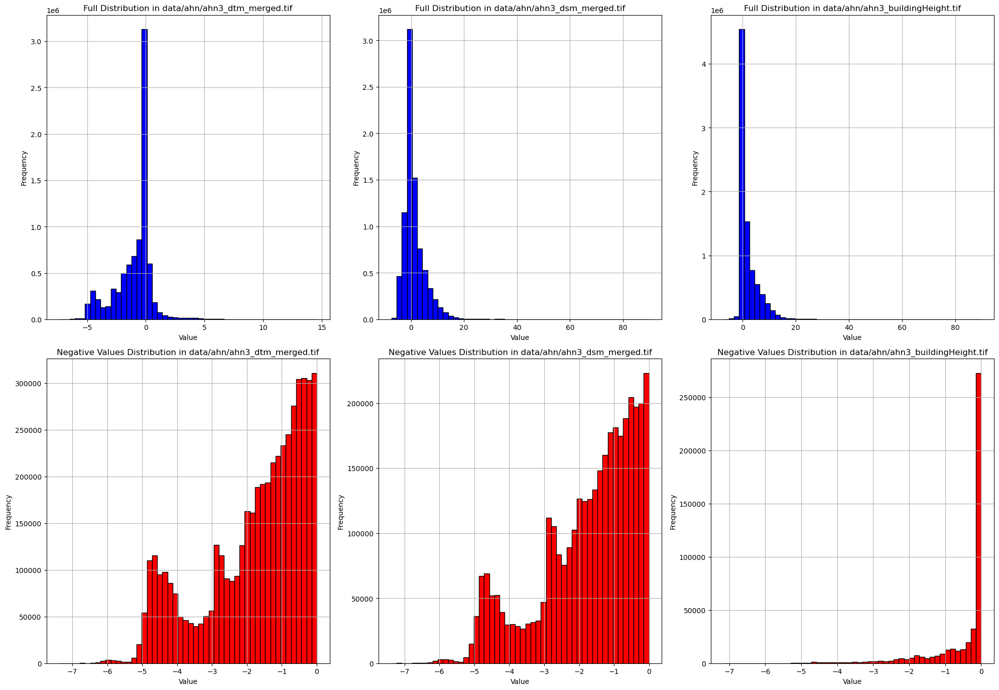

In [76]:
ahn_version = 'ahn3'
file_names = [f'data/ahn/{ahn_version}_dtm_merged.tif', f'data/ahn/{ahn_version}_dsm_merged.tif', f'data/ahn/{ahn_version}_buildingHeight.tif']

# Create a figure with six subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

for idx, file_name in enumerate(file_names):
    # Read the data from the GeoTIFF file
    with rasterio.open(file_name) as src:
        raster = src.read(1)

    # Flatten the array to 1D
    raster_flat = raster.flatten()
    negative_values = raster_flat[raster_flat < 0]

    # Plot the histogram for raster_flat in the first row
    ax1 = axes[0, idx]
    ax1.hist(raster_flat, bins=50, color='blue', edgecolor='black')
    ax1.set_title(f'Full Distribution in {file_name}')
    ax1.set_xlabel('Value')
    ax1.set_ylabel('Frequency')
    ax1.grid(True)

    # Plot the histogram for negative_values in the second row
    ax2 = axes[1, idx]
    ax2.hist(negative_values, bins=50, color='red', edgecolor='black')
    ax2.set_title(f'Negative Values Distribution in {file_name}')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Frequency')
    ax2.grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# Add AHN raster data to db

In [24]:
def connect_to_database():
    import subprocess
    import psycopg2

    # Database connection parameters
    db_name = "urbanmining"
    username = "postgres"
    password = "Tunacompany5694!"
    host = "localhost"
    port = "5432"

    # Connect to the database
    conn = psycopg2.connect(
        dbname=db_name,
        user=username,
        password=password,
        host=host,
        port=port
    )
    conn.autocommit = True
    cur = conn.cursor()

    return conn, cur

def load_geotiff_to_database(geotiff_path, table_name):

    import subprocess
    import psycopg2

    conn, cur = connect_to_database()

    # Full paths to raster2pgsql and psql
    raster2pgsql_path = "/opt/homebrew/bin/raster2pgsql"
    psql_path = "/opt/homebrew/bin/psql"

    # Set the password environment variable
    env = {"PGPASSWORD": password}

    # Drop the existing table if it exists
    drop_table_query = f"DROP TABLE IF EXISTS public.{table_name};"
    cur.execute(drop_table_query)

    # Close the database connection
    cur.close()
    conn.close()

    # raster2pgsql command with tiling option
    raster2pgsql_cmd = [
        raster2pgsql_path,
        "-s", "28992",
        "-I",
        "-C",
        "-M",
        "-t", "100x100",  # Specify the tile size
        geotiff_path,
        f"public.{table_name}"
    ]

    # psql command
    psql_cmd = [
        psql_path,
        "-h", host,
        "-U", username,
        "-d", db_name
    ]

    try:
        # Execute the raster2pgsql command and pipe to psql
        process1 = subprocess.Popen(raster2pgsql_cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, env=env)
        process2 = subprocess.Popen(psql_cmd, stdin=process1.stdout, stdout=subprocess.PIPE, stderr=subprocess.PIPE, env=env)
        process1.stdout.close()  # Allow process1 to receive a SIGPIPE if process2 exits.
        
        out, err = process2.communicate()
        if process2.returncode != 0:
            print(f"Error: {err.decode('utf-8')}")
    except FileNotFoundError as e:
        print(f"FileNotFoundError: {e}")
    except subprocess.CalledProcessError as e:
        print(f"Subprocess error: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")

def combine_geotiffs_in_database(): 
    conn, cur = connect_to_database()
    query = f''' 
    DROP TABLE IF EXISTS ahn_objectheight; 
    CREATE TABLE ahn_objectheight AS 
    SELECT *, 'ahn2' AS ahn_version
    FROM ahn2_objectheight
    UNION ALL 
    SELECT *, 'ahn3' AS ahn_version
    FROM ahn3_objectheight
    UNION ALL 
    SELECT *, 'ahn4' AS ahn_version
    FROM ahn4_objectheight;     
    CREATE INDEX idx_ahn_rast ON ahn_objectheight USING gist (ST_ConvexHull(rast)); 
    '''
    cur.execute(query)
    print(f'combined ahn2, 3, and 4 in database as ahn_objectheight')

In [32]:
load_geotiff_to_database('data/ahn/ahn2_dsm_merged.tif', 'ahn2_dsm_merged')

In [67]:
# find all tiff files ending with 'buildingHeight.tif' and load them to database
tiff_files = [f'data/ahn/{f}' for f in os.listdir('data/ahn') if f.endswith('objectHeight.tif')]
for geotiff_path in tiff_files: 
    table_name = geotiff_path.split('/')[-1].split('.')[0].lower()
    load_geotiff_to_database(geotiff_path, table_name)
    print(f'loaded {geotiff_path} to database as {table_name}')
combine_geotiffs_in_database() 

loaded data/ahn/ahn2_objectHeight.tif to database as ahn2_objectheight
loaded data/ahn/ahn3_objectHeight.tif to database as ahn3_objectheight
loaded data/ahn/ahn4_objectHeight.tif to database as ahn4_objectheight
combined ahn2, 3, and 4 in database as ahn_objectheight


# Get building info: height, n_floors, sqm
By combining BAG and AHN data 

In [217]:
df.status.unique()

array(['Pand gesloopt', 'Bouw gestart', 'Verbouwing pand'], dtype=object)

In [230]:
pd.read_sql('''
            SELECT * FROM housing_emissions_nl WHERE id_pand = '0344100000085059'
            ''', engine)

,id_pand,build_year,status,registration_start,registration_end,geom,geom_28992,sqm,n_units,av_unit_sqm,footprint,n_floors
0,0344100000085059,2003,Bouw gestart,2010-06-11,2012-08-30,0103000020E61000000100000007000000CF9F230878FB...,0103000020407100000100000007000000696F0F48154A...,None,None,None,15.292588,None


In [229]:
ahn_ranges = {
    'ahn2': ['2007-01-01', '2012-12-31'], # 2007 - 2012
    'ahn3': ['2014-01-01', '2019-12-31'], # 2014 - 2019
    'ahn4': ['2020-01-01', '2022-12-31'], # 2020 - 2022 
}

ahn_version = 'ahn2'
query = f''' 
WITH buildings AS (
    SELECT * 
    FROM housing_emissions_nl
    TABLESAMPLE BERNOULLI(3)
    WHERE sqm IS NULL
), 
buildings_{ahn_version} AS (
    SELECT * 
    FROM buildings 
    WHERE 
        (status = 'Bouw gestart' AND CAST(build_year AS INTEGER) < {int(ahn_ranges[ahn_version][0][:4])-3}) -- OR 
        -- (status = 'Verbouwing pand' AND registration_start BETWEEN {ahn_ranges[ahn_version][0]} AND {ahn_ranges[ahn_version][1]}) OR
        -- (status = 'Pand gesloopt' AND registration_start > {ahn_ranges[ahn_version][1]})
)
SELECT * FROM buildings_{ahn_version}
'''
df = pd.read_sql(query, engine)
df.sort_values('build_year', ascending=False)

,id_pand,build_year,status,registration_start,registration_end,geom,geom_28992,sqm,n_units,av_unit_sqm,footprint,n_floors
4,0344100000085059,2003,Bouw gestart,2010-06-11,2012-08-30,0103000020E61000000100000007000000CF9F230878FB...,0103000020407100000100000007000000696F0F48154A...,None,None,None,15.292588,None
19,0505100000000086,2002,Bouw gestart,2010-03-23,2010-12-07,0103000020E61000000100000005000000A2D6B2A890B1...,01030000204071000001000000050000008B6B26FADACF...,None,None,None,1039.348962,None
2,1721100000005994,2002,Bouw gestart,2011-07-14,2015-01-12,0103000020E61000000100000008000000D1972A6476F6...,01030000204071000001000000080000007C81ABBC94CB...,None,None,None,844.157174,None
25,0512100000241613,2002,Bouw gestart,2013-01-09,2013-01-09,0103000020E610000001000000D600000064BE8EA5D4D8...,01030000204071000001000000D6000000FE04EC97DAAE...,None,None,None,13475.356318,None
45,0498100000014347,1999,Bouw gestart,2012-05-31,2012-12-03,0103000020E61000000100000009000000818DBA7AFDBF...,0103000020407100000100000009000000FF115C066E45...,None,None,None,2149.242282,None
40,0175100000003661,1999,Bouw gestart,2013-12-20,2015-06-18,0103000020E610000001000000060000007F1DB813269C...,010300002040710000010000000600000049603D504059...,None,None,None,410.448290,None
28,0037100000015169,1992,Bouw gestart,2011-09-12,2012-03-22,0103000020E61000000100000007000000C1CFC87190EA...,0103000020407100000100000007000000560F294A70F5...,None,None,None,2453.382772,None
15,1507100000020476,1992,Bouw gestart,2013-05-13,2014-01-24,0103000020E61000000100000010000000EAD7566843FF...,0103000020407100000100000010000000B2434EAA8B1E...,None,None,None,2971.360243,None
22,0230100000017631,1991,Bouw gestart,1990-10-02,2012-02-27,0103000020E61000000100000005000000F8105DB45647...,0103000020407100000100000005000000A7F9E0431083...,None,None,None,16.149062,None
9,1896100000010704,1990,Bouw gestart,2011-03-03,2011-12-20,0103000020E610000001000000050000002A2E3AEC4B5F...,010300002040710000010000000500000061C174B096C1...,None,None,None,478.868464,None


In [187]:
def get_building_sqm(table_name, engine): 
    return None 

# select buildings from housing_emissions_nl according to ahn_version and date

query = ''' 
WITH clipped_rasters AS (
    SELECT 
        b.*,
        ST_Clip(r.rast, 1, b.geom_28992, -999999) AS clipped_raster
    FROM
        housing_emissions_nl b, ahn2_buildingheight r
    WHERE
        ST_Intersects(r.rast, b.geom_28992)
), 
clipped_rasters_with_stats AS (
    SELECT *, (ST_SummaryStats(clipped_raster, true)).*
    FROM clipped_rasters
), 
building_heights AS (
    SELECT id_pand, max / 3 AS n_floors, max AS height, *
    FROM clipped_rasters_with_stats
)
SELECT * FROM building_heights
'''
df = pd.read_sql(query, engine) 
df

,id_pand,n_floors,height,id_pand,build_year,status,registration_start,registration_end,geom,geom_28992,...,av_unit_sqm,footprint,n_floors,clipped_raster,count,sum,mean,stddev,min,max
0,0518100000206618,2.630036,7.890109,0518100000206618,1921,Pand gesloopt,2016-10-31,None,0103000020E610000001000000080000000B8CB671DA36...,0103000020407100000100000008000000FEB7DBC643B3...,...,55.0,68.011317,2.455474,0100000100000000000000004000000000000000C08CB9...,17,96.167554,5.656915,2.777084,1.924463,7.890109
1,0518100000211845,3.494174,10.482523,0518100000211845,1949,Pand gesloopt,2016-01-06,None,0103000020E61000000100000009000000BACF215E995C...,0103000020407100000100000009000000E2A0C7ED9C51...,...,50.0,66.494455,2.255827,0100000100000000000000004000000000000000C08CB9...,16,155.259703,9.703731,2.225141,1.876245,10.482523
2,0518100000212322,2.963945,8.891834,0518100000212322,1921,Pand gesloopt,2017-12-21,None,0103000020E6100000010000000D000000E202839DCC37...,010300002040710000010000000D00000041DC890E3FB7...,...,54.0,70.826230,1.538978,0100000100000000000000004000000000000000C08CB9...,18,131.831084,7.323949,1.917364,2.262751,8.891834
3,0518100000213195,2.383215,7.149646,0518100000213195,1926,Pand gesloopt,2013-05-21,None,0103000020E610000001000000070000009905480DC73E...,010300002040710000010000000700000033A49A662ED3...,...,70.0,61.232042,2.286385,0100000100000000000000004000000000000000C08CB9...,16,85.731069,5.358192,2.677814,0.932099,7.149646
4,0518100000214350,3.678689,11.036066,0518100000214350,1953,Pand gesloopt,2021-07-12,None,0103000020E61000000100000013000000518E8522F136...,01030000204071000001000000130000009403400213B2...,...,47.0,133.299414,2.138044,0100000100000000000000004000000000000000C08CB9...,34,296.107431,8.709042,3.465053,0.106423,11.036066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12198,0503100000037092,1.515426,4.546278,0503100000037092,2020,Bouw gestart,2021-12-17,2022-05-02,0103000020E610000001000000050000001D2905B8B76E...,01030000204071000001000000050000004269EDF35597...,...,NaN,5.379381,NaN,0100000100000000000000004000000000000000C08CB9...,1,4.546278,4.546278,0.000000,4.546278,4.546278
12199,0503100000037130,2.376565,7.129696,0503100000037130,2021,Bouw gestart,2021-06-14,2022-12-01,0103000020E6100000010000000500000098B78DEA926D...,01030000204071000001000000050000009ED6D8451092...,...,141.0,52.797566,2.670578,0100000100000000000000004000000000000000C08CB9...,14,98.864399,7.061743,0.091169,6.939426,7.129696
12200,0503100000037215,0.075533,0.226600,0503100000037215,2012,Pand gesloopt,2022-06-16,None,0103000020E610000001000000050000009CD136340868...,01030000204071000001000000050000007853A73DC07A...,...,NaN,3.118758,NaN,0100000100000000000000004000000000000000C08CB9...,1,0.226600,0.226600,0.000000,0.226600,0.226600
12201,0503100000037526,5.479652,16.438957,0503100000037526,2021,Pand gesloopt,2022-11-07,None,0103000020E61000000100000005000000ADF1D7134466...,0103000020407100000100000005000000D179AFE92475...,...,NaN,7.016294,NaN,0100000100000000000000004000000000000000C08CB9...,2,32.877914,16.438957,0.000000,16.438957,16.438957


# Code dump

In [ ]:
from osgeo import gdal
import os

# get tiff file names in 'data/ahn' folder that start with 'ahn2_'
tiff_tiles = [f for f in os.listdir('data/ahn') if f.startswith('ahn2_')]
tiff_tiles = [os.path.join('data/ahn', f) for f in tiff_tiles]
tiff_tiles_combined = 'data/ahn/ahn2_combined.tif'
gdal.Warp(tiff_tiles_combined, tiff_tiles, format='GTiff')

def get_buildingFootprint(id_pand, engine):
    query = f'''
    SELECT id_pand, geom_28992 
    FROM housing_emissions_nl 
    WHERE id_pand = '{id_pand}'
    '''
    building = gpd.read_postgis(query, engine, geom_col='geom_28992')
    return building

def get_clippedRaster_forOneBuilding(id_pand, table_name, engine):
    query = f'''
    SET postgis.gdal_enabled_drivers = 'ENABLE_ALL';
    WITH buildings_intersecting_raster AS (
    SELECT b.id_pand, b.geom_28992, b.status
    FROM housing_emissions_nl b, {table_name} r
    WHERE ST_Intersects(r.rast, b.geom_28992) AND b.id_pand = '{id_pand}'
    ), 
    clipped_rasters AS (
    SELECT
        bir.id_pand,
        ST_Clip(r.rast, bir.geom_28992) AS clipped_raster
    FROM
        buildings_intersecting_raster bir, {table_name} r
    WHERE
        ST_Intersects(r.rast, bir.geom_28992)
    )
    SELECT id_pand, encode(ST_AsGDALRaster(clipped_raster, 'GTiff'), 'base64') AS clipped_raster_binary
    FROM clipped_rasters
    '''
    df = pd.read_sql(query, engine)
    raster_data = df.iloc[0]['clipped_raster_binary']
    raster_data = base64.b64decode(raster_data)
    with rasterio.open(io.BytesIO(raster_data)) as src:
        raster = src.read(1)
    return raster

def plot_clipped_rasters_withBuildingFootprint(df, building_id):
    # building_id = 0518100000253482
    # get building footprint
    query = f'''
    SELECT id_pand, geom_28992 
    FROM housing_emissions_nl 
    WHERE id_pand = '{building_id}'
    '''
    building = gpd.read_postgis(query, engine, geom_col='geom_28992')
    building.to_crs('epsg:4326', inplace=True)

    # get clipped raster
    query = f'''
    WITH buildings_intersecting_raster AS (
    SELECT b.id_pand, b.geom_28992, b.status
    FROM housing_emissions_nl b, {table_name} r
    WHERE ST_Intersects(r.rast, b.geom_28992)
    ), 
    clipped_rasters AS (
    SELECT
        bir.id_pand,
        ST_Clip(r.rast, bir.geom_28992) AS clipped_raster
    FROM
        buildings_intersecting_raster bir, public.ahn2_88 r
    WHERE
        ST_Intersects(r.rast, bir.geom_28992)
    )
    SELECT *, (ST_SummaryStats(clipped_raster, true)).*
    FROM clipped_rasters
    '''

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x309826e70> >

In [ ]:
print('checking raster metadata...')
with rasterio.open('data/ahn/ahn2_buildingHeight.tif') as src:
    data = src.read(1, masked=True)
    print(f'minimum: {data.min()}, maximum: {data.max()}')
    print(f'nodata value: {src.nodata}')

    # check percentage of nodata values in raster
    nodata_pixels = np.sum(data.mask)
    total_pixels = data.size
    nodata_percentage = nodata_pixels / total_pixels * 100
    print(f'Percentage of nodata values: {nodata_percentage:.2f}%')

    # check crs of raster
    print(f'CRS: {src.crs}')

    # check data type of raster
    print(f'Data type: {data.dtype}')

print('\nchecking raster metadata in database...')
query = '''
SELECT
  MIN((stats).min) AS min_value,
  MAX((stats).max) AS max_value
FROM (
  SELECT ST_SummaryStats(rast, TRUE) AS stats
  FROM ahn2_buildingheight
) AS summary;
'''
df = pd.read_sql(query, engine)
print(f'minimum: {df.min_value[0]}, maximum: {df.max_value[0]}')
print('Percentage of nodata values: 0%')

query = '''
SELECT ST_SRID(rast) AS srid
FROM ahn2_buildingheight
LIMIT 1;
'''
df = pd.read_sql(query, engine)
print(f'CRS: {df.srid[0]}')

df = pd.read_sql('''SELECT (ST_BandMetaData(rast)).* 
FROM ahn2_buildingheight 
LIMIT 1;
''', engine)
print(f'data type: {df.pixeltype[0]}')

print('\nchecking clipped rasters...')
query = '''
WITH buildings_intersecting_raster AS (
  SELECT b.id_pand, b.geom_28992, b.status
  FROM housing_emissions_nl b, ahn2_buildingheight r
  WHERE ST_Intersects(r.rast, b.geom_28992)
), 
clipped_rasters AS (
  SELECT
    bir.id_pand,
    ST_Clip(r.rast, bir.geom_28992) AS clipped_raster
  FROM
    buildings_intersecting_raster bir, public.ahn2_88 r
  WHERE
    ST_Intersects(r.rast, bir.geom_28992)
)
SELECT *, (ST_SummaryStats(clipped_raster, true)).*
FROM clipped_rasters
'''
df = pd.read_sql(query, engine)
df
# print(f'minimum: {df.global_minimum[0]}, maximum: {df.global_maximum[0]}')

checking raster metadata...
minimum: -16.35999870300293, maximum: 127.99071502685547
nodata value: None
Percentage of nodata values: 0.00%
CRS: EPSG:28992
Data type: float32

checking raster metadata in database...
minimum: -16.35999870300293, maximum: 127.99071502685547
Percentage of nodata values: 0%
CRS: 28992
data type: 32BF

checking clipped rasters...


,id_pand,clipped_raster,count,sum,mean,stddev,min,max
0,0518100000244367,0100000200000000000000144000000000000014C08CB9...,4,-1.020847e+39,-2.552118e+38,1.473466e+38,-3.402823e+38,-3.326149e+02
1,0518100000247849,0100000200000000000000144000000000000014C08CB9...,4,-1.361129e+39,-3.402823e+38,0.000000e+00,-3.402823e+38,-3.402823e+38
2,0518100000251038,0100000200000000000000144000000000000014C08CB9...,4,-1.020847e+39,-2.552118e+38,1.473466e+38,-3.402823e+38,-3.946201e+02
3,0518100000251115,0100000200000000000000144000000000000014C08CB9...,20,-4.763953e+39,-2.381976e+38,1.559370e+38,-3.402823e+38,-2.573711e+02
4,0518100000253222,0100000200000000000000144000000000000014C08CB9...,4,-1.020847e+39,-2.552118e+38,1.473466e+38,-3.402823e+38,-4.421425e+02
...,...,...,...,...,...,...,...,...
18487,0503100000037936,0100000200000000000000144000000000000014C08CB9...,4,-1.020847e+39,-2.552118e+38,1.473466e+38,-3.402823e+38,-1.854874e+02
18488,0503100000037944,0100000200000000000000144000000000000014C08CB9...,4,-1.361129e+39,-3.402823e+38,0.000000e+00,-3.402823e+38,-3.402823e+38
18489,0503100000037949,0100000200000000000000144000000000000014C08CB9...,4,-1.361129e+39,-3.402823e+38,0.000000e+00,-3.402823e+38,-3.402823e+38
18490,0503100000037953,0100000200000000000000144000000000000014C08CB9...,4,-1.020847e+39,-2.552118e+38,1.473466e+38,-3.402823e+38,-1.849062e+02
